In [ ]:
!pip install numpy==1.24.4
!pip install pycocotools

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import json
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import functional as F
from PIL import Image
from google.colab import drive
from pycocotools.coco import COCO

# Drive'a bağlan
print("🔗 Drive'a bağlanıyor...")
drive.mount('/content/drive')

# Model ve test veri yolunu ayarla
MODEL_PATH = "/content/drive/MyDrive/fasterrcnn_model_coco.pth"
TEST_IMAGE_DIR = "/content/drive/MyDrive/test/images"
OUTPUT_JSON = "/content/drive/MyDrive/fasterrcnn_test_predictions.json"

# Modeli yükle
print("🔄 Model yükleniyor...")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = fasterrcnn_resnet50_fpn(pretrained=True)

# Eğitimdeki sınıf sayısını ayarla (background dahil)
num_classes = 3  # SENİN VERİ SETİNDEKİ SINIF SAYISI + 1 (background)

# Modelin sınıf katmanını değiştir
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Model ağırlıklarını yükle
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device)
model.eval()
print("✅ Model başarıyla yüklendi!")

# Test görsellerini al
image_files = [f for f in os.listdir(TEST_IMAGE_DIR) if f.endswith('.jpg') or f.endswith('.png')]
print(f"🖼️ {len(image_files)} adet test görseli bulundu.")

results = []

# Görsellerde tahmin yap
for image_file in image_files:
    image_path = os.path.join(TEST_IMAGE_DIR, image_file)
    img = Image.open(image_path).convert("RGB")
    tensor = F.to_tensor(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(tensor)
        output = outputs[0]
        boxes = output['boxes'].cpu().numpy()
        scores = output['scores'].cpu().numpy()
        labels = output['labels'].cpu().numpy()

    # Tahminleri COCO formatına çevir
    for box, score, label in zip(boxes, scores, labels):
        if score < 0.5:
            continue
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin
        results.append({
            "image_id": image_file,
            "category_id": int(label),
            "bbox": [round(float(xmin), 2), round(float(ymin), 2), round(float(width), 2), round(float(height), 2)],
            "score": round(float(score), 4)
        })

print(f"💾 {len(results)} tahmin kaydediliyor...")

# Tahminleri COCO formatında kaydet
with open(OUTPUT_JSON, 'w') as f:
    json.dump(results, f, indent=4)

print(f"✅ Tahminler başarıyla kaydedildi: {OUTPUT_JSON}")


🔗 Drive'a bağlanıyor...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🔄 Model yükleniyor...
✅ Model başarıyla yüklendi!
🖼️ 165 adet test görseli bulundu.
💾 193 tahmin kaydediliyor...
✅ Tahminler başarıyla kaydedildi: /content/drive/MyDrive/fasterrcnn_test_predictions.json


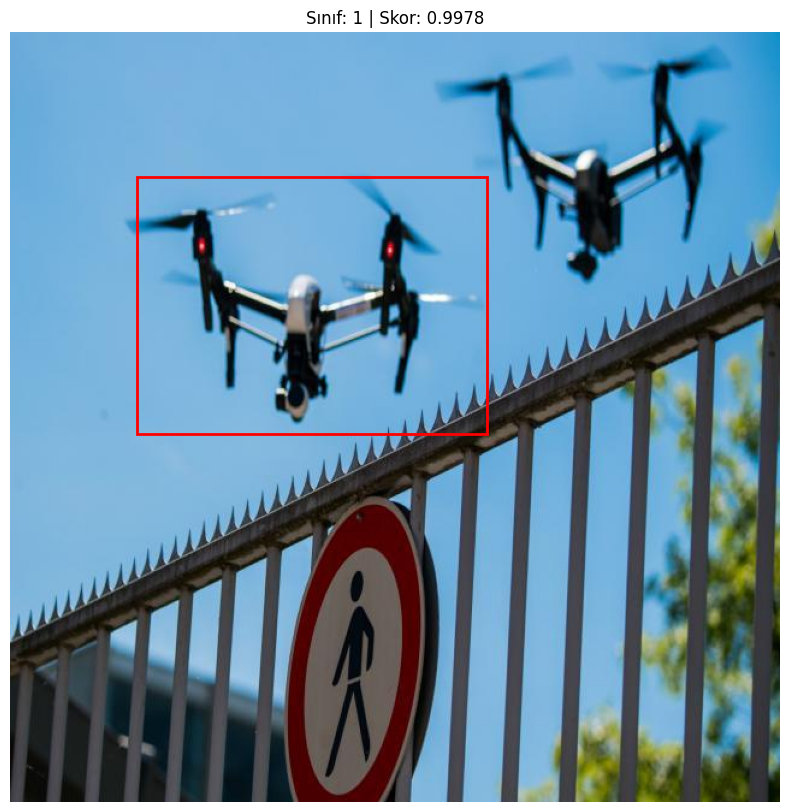

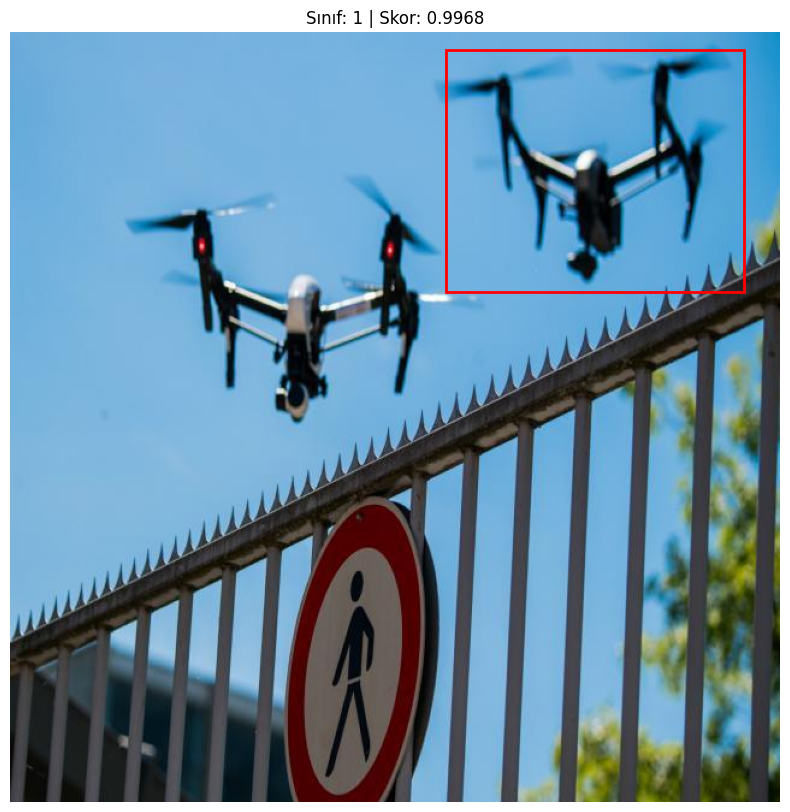

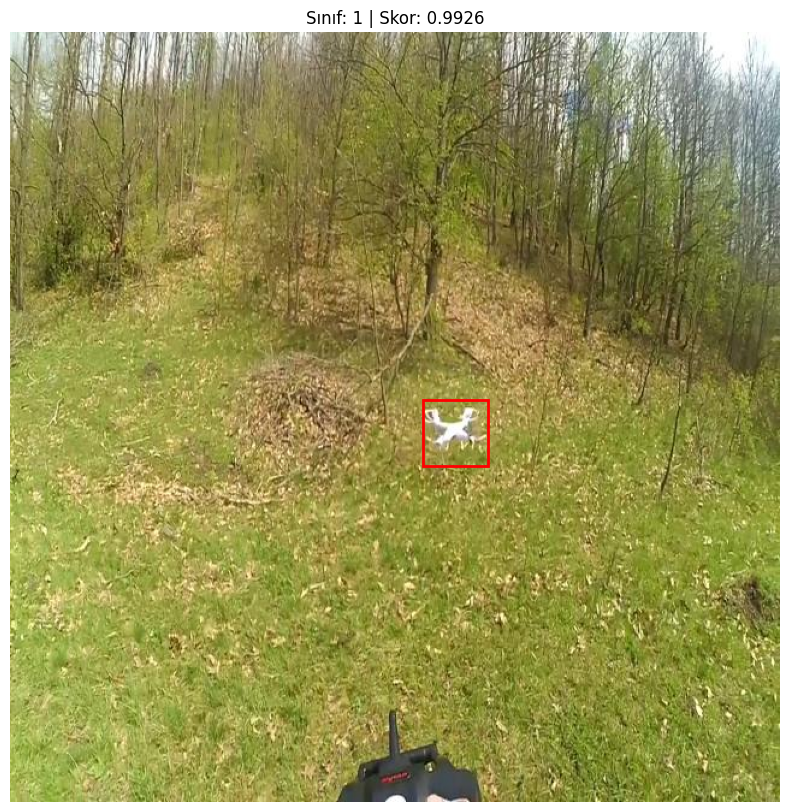

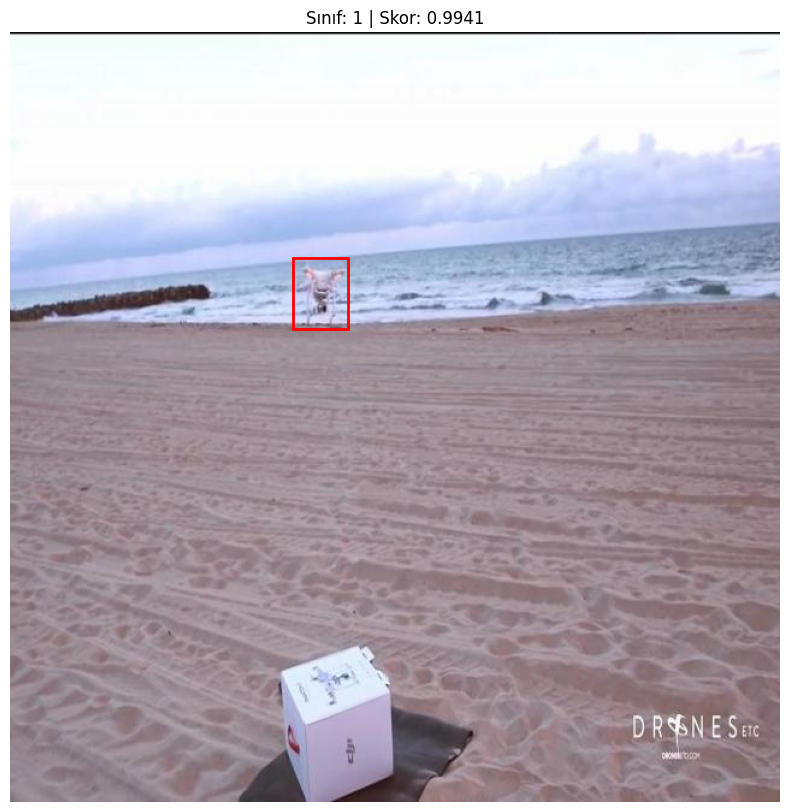

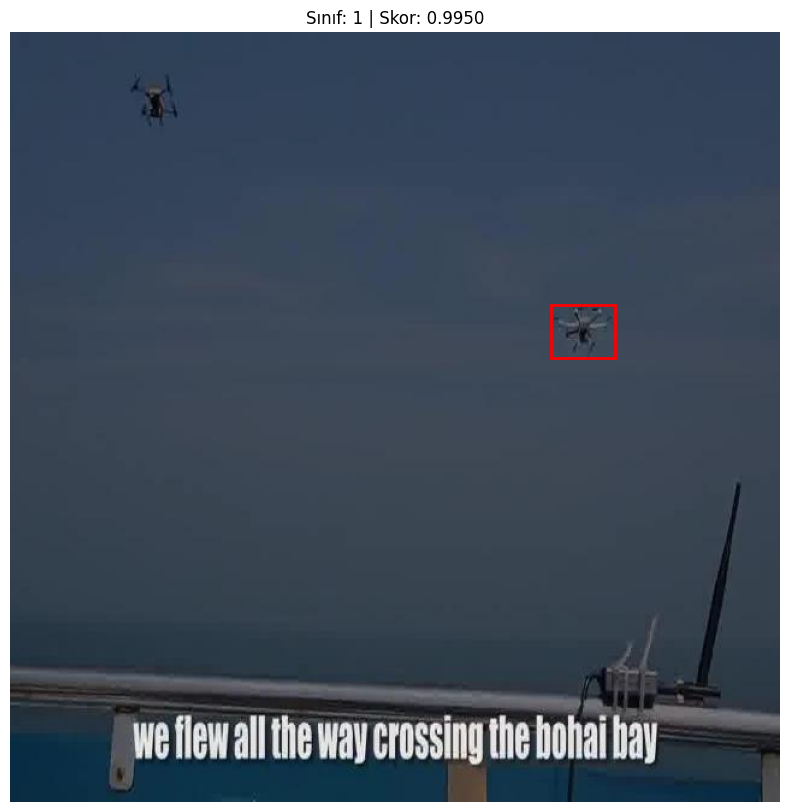

...

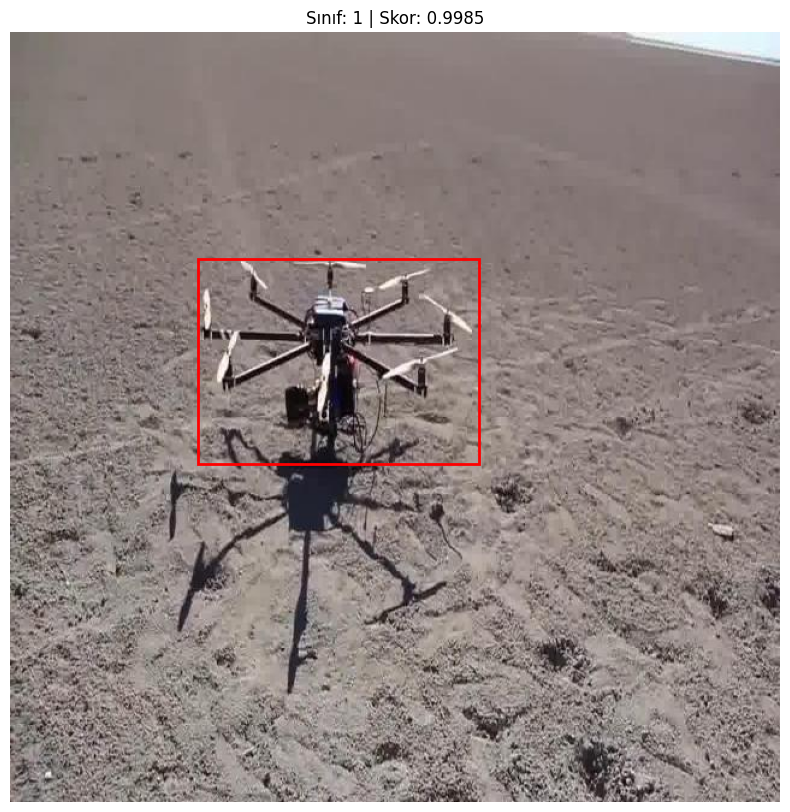

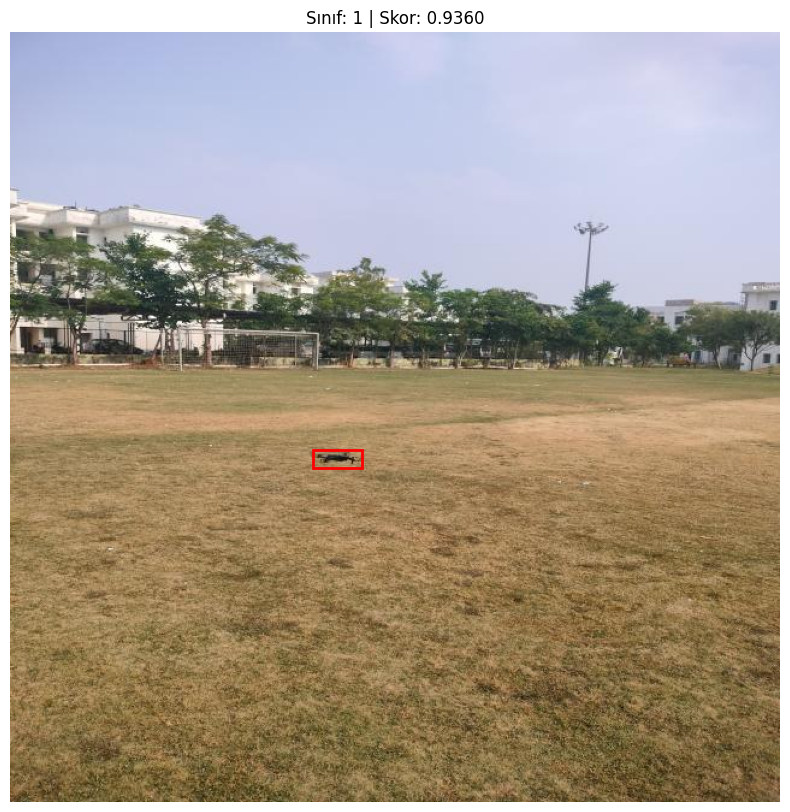

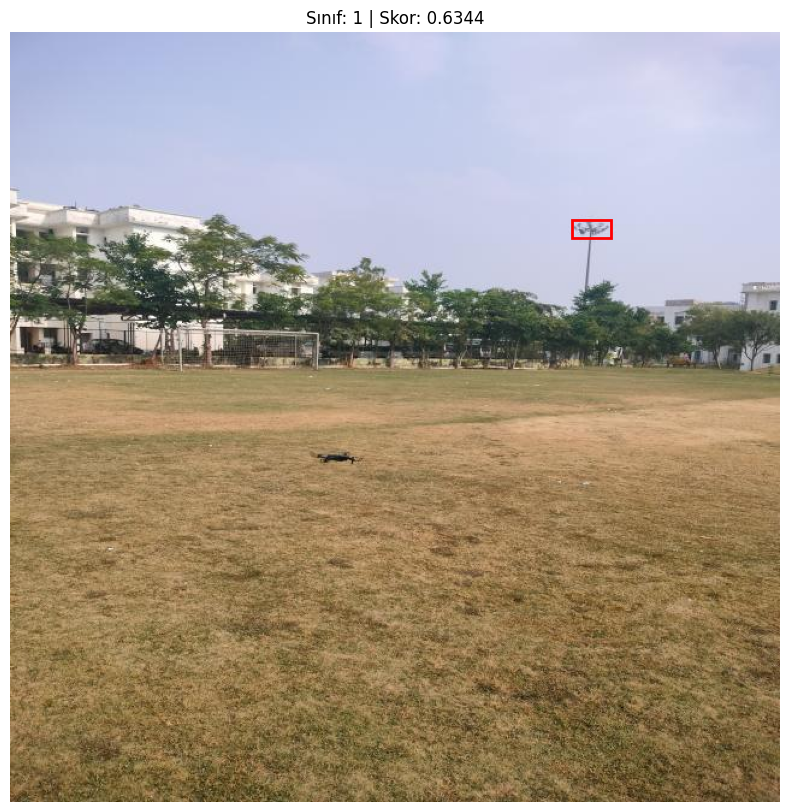

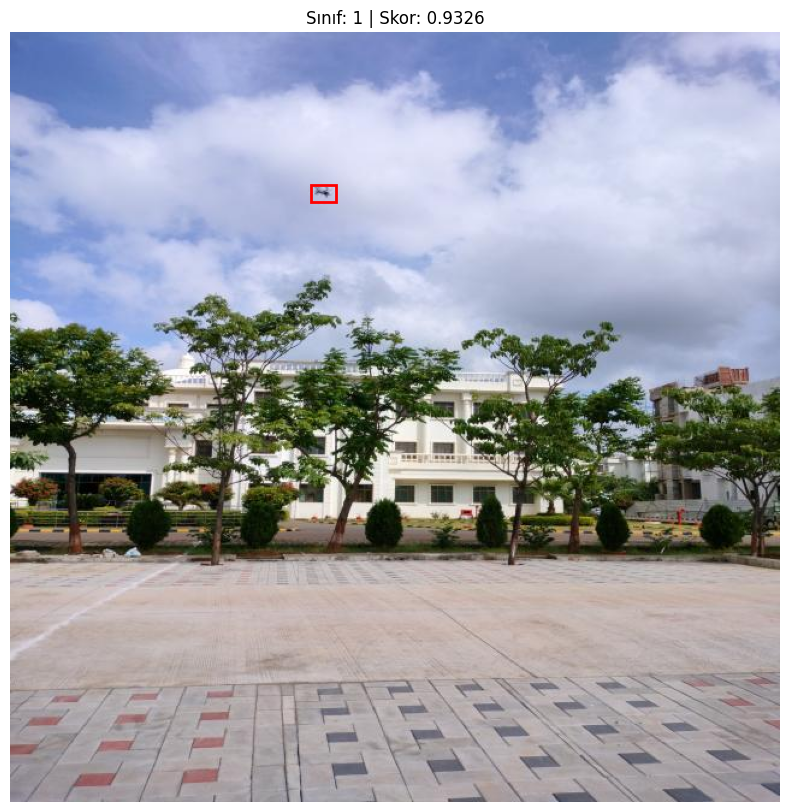

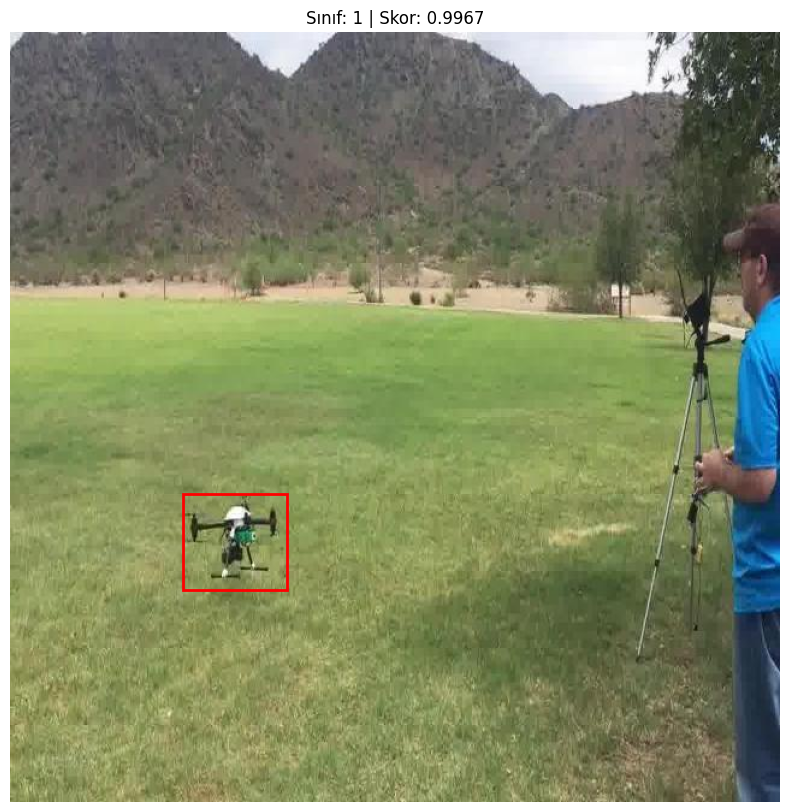

In [ ]:
import os
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Tahmin dosyasının yolunu ayarla
predictions_file = "/content/drive/MyDrive/fasterrcnn_test_predictions.json"
test_image_dir = "/content/drive/MyDrive/test/images"

# Tahminleri yükle
with open(predictions_file, 'r') as f:
    predictions = json.load(f)

# Görselleri ve tahminleri göster
for prediction in predictions[:15]:  # İlk 15 tahmin için
    image_id = prediction["image_id"]
    category_id = prediction["category_id"]
    bbox = prediction["bbox"]
    score = prediction["score"]

    # Görüntü yolunu oluştur
    image_path = os.path.join(test_image_dir, image_id)

    # Görüntüyü yükle
    img = Image.open(image_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)

    # Kutu çizme
    xmin, ymin, width, height = bbox
    rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none')
    plt.gca().add_patch(rect)
    plt.title(f"Sınıf: {category_id} | Skor: {score:.4f}")
    plt.axis("off")
    plt.show()


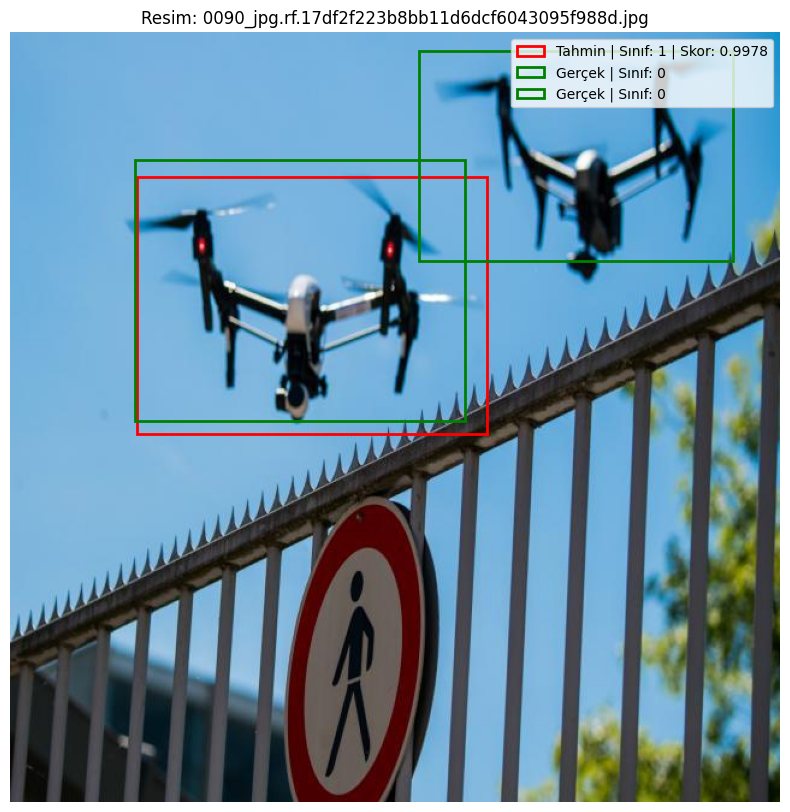

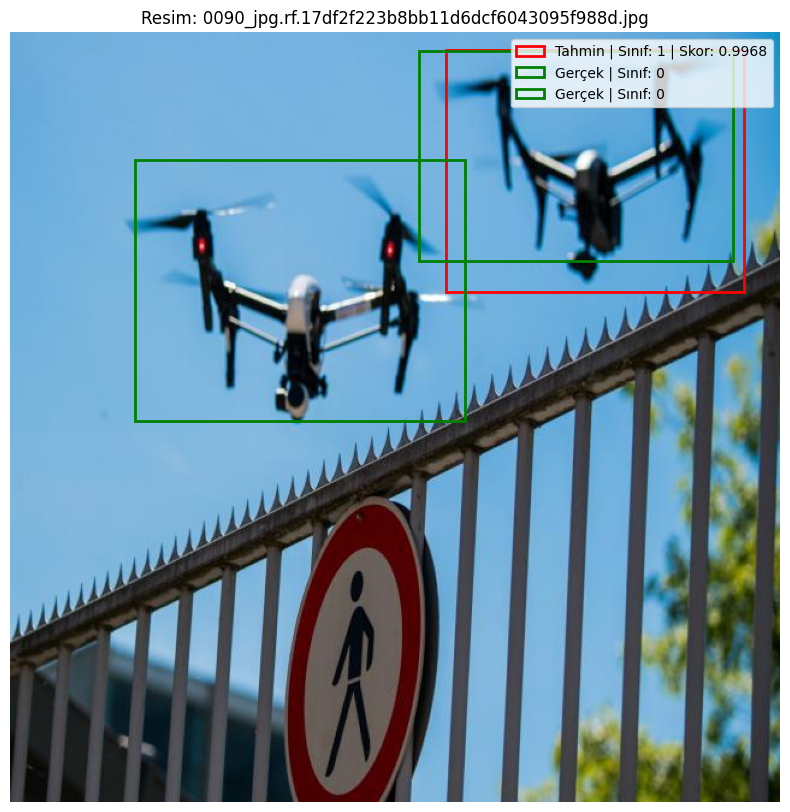

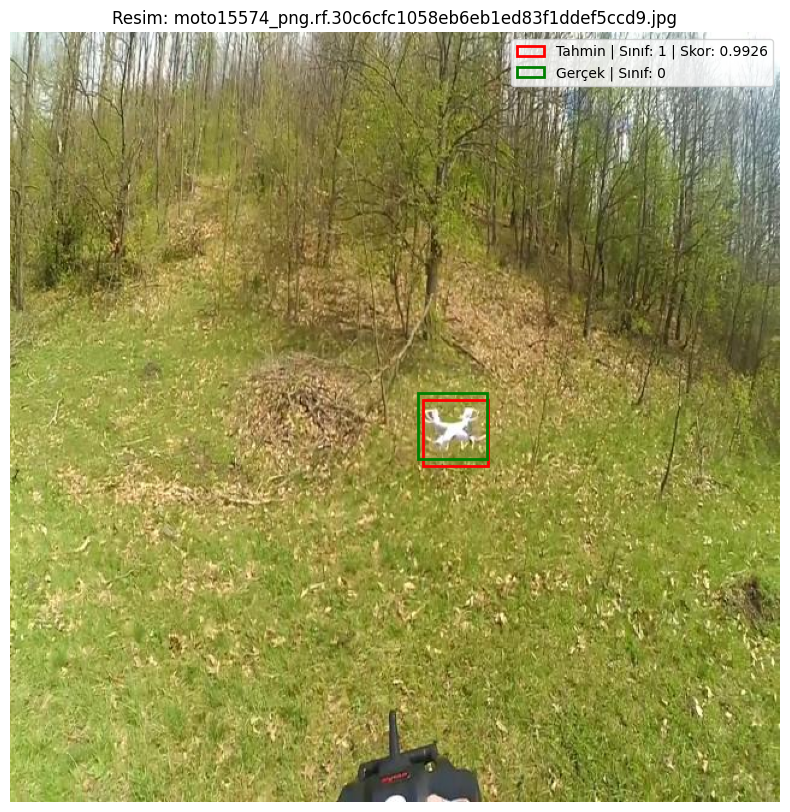

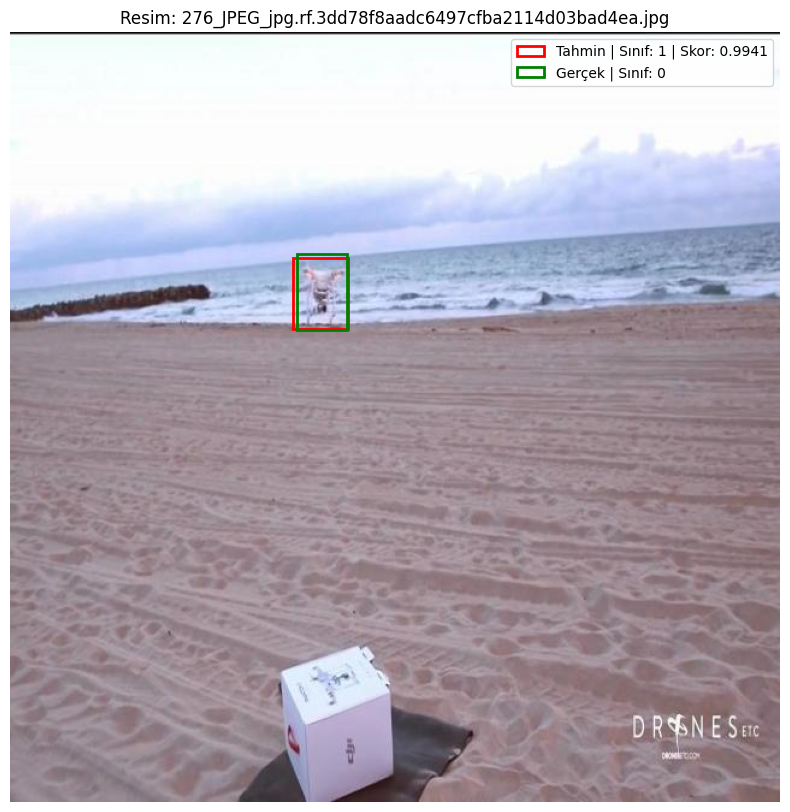

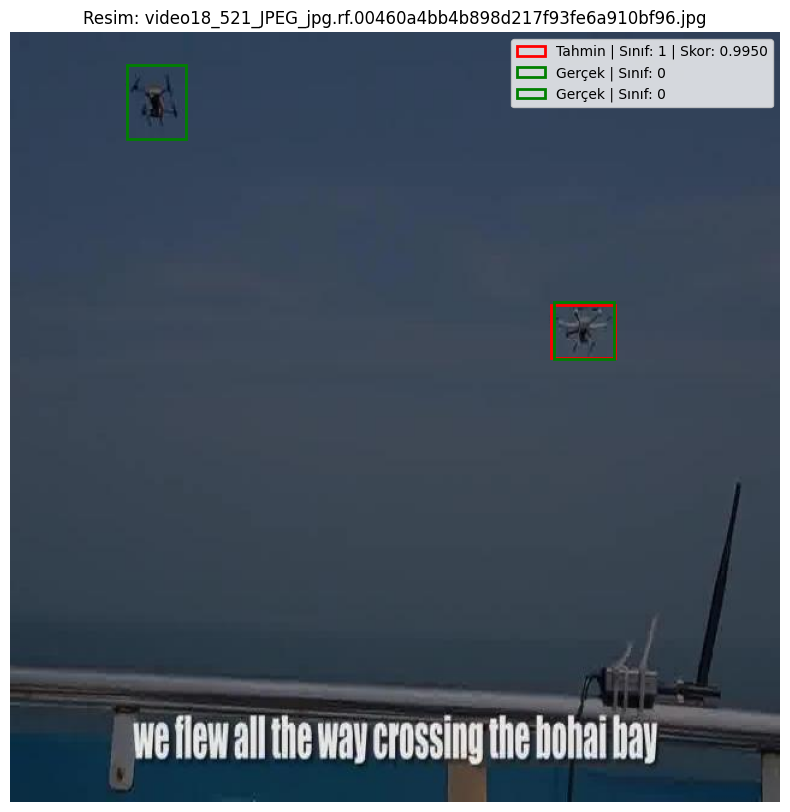

In [ ]:
import os
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Yol ayarları
predictions_file = "/content/drive/MyDrive/fasterrcnn_test_predictions.json"
test_image_dir = "/content/drive/MyDrive/test/images"
test_label_dir = "/content/drive/MyDrive/test/labels"

# Tahminleri yükle
with open(predictions_file, 'r') as f:
    predictions = json.load(f)

# Görselleri ve tahminleri göster
for prediction in predictions[:5]:  # İlk 5 görüntü için
    image_id = prediction["image_id"]
    pred_bbox = prediction["bbox"]
    pred_category = prediction["category_id"]
    pred_score = prediction["score"]

    # Görüntü yolunu oluştur
    image_path = os.path.join(test_image_dir, image_id)
    label_path = os.path.join(test_label_dir, image_id.replace(".jpg", ".txt").replace(".png", ".txt"))

    # Görüntüyü yükle
    img = Image.open(image_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)

    # Tahmin edilen kutuları çiz (Kırmızı)
    xmin, ymin, width, height = pred_bbox
    rect_pred = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none', label=f"Tahmin | Sınıf: {pred_category} | Skor: {pred_score:.4f}")
    plt.gca().add_patch(rect_pred)

    # Gerçek etiketli kutuları çiz (Yeşil)
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                true_category = int(parts[0])
                x_center, y_center, w, h = map(float, parts[1:])

                # YOLO formatını COCO formatına dönüştür
                img_w, img_h = img.size
                true_xmin = (x_center - w / 2) * img_w
                true_ymin = (y_center - h / 2) * img_h
                true_width = w * img_w
                true_height = h * img_h

                rect_true = patches.Rectangle((true_xmin, true_ymin), true_width, true_height, linewidth=2, edgecolor='g', facecolor='none', label=f"Gerçek | Sınıf: {true_category}")
                plt.gca().add_patch(rect_true)

    plt.title(f"Resim: {image_id}")
    plt.legend(loc="upper right")
    plt.axis("off")
    plt.show()
